In [ ]:
%load_ext autoreload
%autoreload 2

import json
import os
import pickle
from collections import defaultdict
from glob import glob
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from matplotlib import rcParams
from matplotlib.lines import Line2D

from plot_utils import * 

# Table 2
Create Table 2 and setup up some basics used for plotting

In [ ]:
params = {
    'font.size': 18,
    'legend.fontsize': 18,
    'text.usetex': False,
}
rcParams.update(params)

results_dir = Path('./results/goal_directed_v2/')

columns = ['AssayID', 'TargetName', 'TargetID']
rows = [('CHEMBL3888429', 'JAK2', 'CHEMBL2971'),
        ('CHEMBL1909203', 'EGFR', 'CHEMBL203'),
        ('CHEMBL1909140', 'DRD2', 'CHEMBL217')]

assay_info = pd.DataFrame(rows, columns=columns)


chid2name = dict(zip(assay_info['AssayID'], assay_info['TargetName']))

order = ('Split1', 'Split1_alt', 'Split2')
col_dict = dict(zip(order, ['blue', 'green', 'red']))
col_dict2 = dict(zip(order, ['cyan', 'magenta', 'green']))
ls_dict = dict(zip(order, ['-', '--', '-.']))
legend_dict = dict(zip(order, ['Optimization score', 'Model control score', 'Data control score']))
chids = ['CHEMBL3888429', 'CHEMBL1909203', 'CHEMBL1909140']




assay_stats = []

for chid in assay_info.AssayID:
    row = {}
    assay_data = pd.read_csv(f'./assays/processed/{chid}.csv')
    label = assay_data['label']
    
    row['active'] = label.sum()
    row['inactive'] = len(label) - row['active']
    row['size'] = len(label)
    assay_stats.append(row)

assay_info = pd.concat([assay_info, pd.DataFrame(assay_stats)], 1)

aucs = defaultdict(list)
for optimizer in ['graph_ga', 'lstm_hc']:    
    for i, chid in enumerate(chids):
        _, _, auc, _, _ = load_chid(results_dir/optimizer/chid, order)
        aucs[chid] += [v for x in auc.values() for v in x]

auc_ms = {}
for chid, auc in aucs.items():
    a = np.array(auc)
    auc_ms[chid] = (a.mean(), a.std())

auc_df = pd.DataFrame(auc_ms).transpose()
auc_df.columns = ['AUC_mean', 'AUC_std']
auc_df['AssayID'] = auc_df.index
assay_info = assay_info.merge(auc_df, on='AssayID')

pm = [f"${auc:.2f}\pm{std:.2f}$" for auc, std in zip(assay_info['AUC_mean'], assay_info['AUC_std'])]
assay_info['AUC'] = pm

columns=['TargetName', 'AssayID', 'active', 'inactive', 'AUC']
names = ['Target', 'ChEMBL ID', 'Active', 'Inactive', 'AUC']
df_fil = assay_info[columns]
df_fil.columns = names
lt = df_fil.to_latex(float_format="%.2f", escape=False, index=False)
print(lt)
assay_info

\begin{tabular}{llrrl}
\toprule
Target &      ChEMBL ID &  Active &  Inactive &            AUC \\
\midrule
  JAK2 &  CHEMBL3888429 &     140 &       527 &  $0.78\pm0.02$ \\
  EGFR &  CHEMBL1909203 &      40 &       802 &  $0.75\pm0.05$ \\
  DRD2 &  CHEMBL1909140 &      59 &       783 &  $0.86\pm0.03$ \\
\bottomrule
\end{tabular}



,AssayID,TargetName,TargetID,active,inactive,size,AUC_mean,AUC_std,AUC
0,CHEMBL3888429,JAK2,CHEMBL2971,140,527,667,0.782164,0.018090,$0.78\pm0.02$
1,CHEMBL1909203,EGFR,CHEMBL203,40,802,842,0.751573,0.052386,$0.75\pm0.05$
2,CHEMBL1909140,DRD2,CHEMBL217,59,783,842,0.858855,0.025844,$0.86\pm0.03$


In [ ]:
results = defaultdict(list)
for fn in glob('results/addcarbon/**/guacamol_results.json'):
    with open(fn, 'r') as f:
        r = json.load(f)['results']
        for bm in r:
            results[bm['benchmark_name']].append(bm['score'])

for k, l in results.items():
    print(f"{k}:\t{np.mean(l):.4f} +- {np.std(l):.4f}")

Validity:	1.0000 +- 0.0000
Uniqueness:	0.9994 +- 0.0004
Novelty:	1.0000 +- 0.0000
KL divergence:	0.9827 +- 0.0016
Frechet ChemNet Distance:	0.8664 +- 0.0024


## Figure 3: Median scores for both optimizers

results/goal_directed_v2/graph_ga/CHEMBL3888429
results/goal_directed_v2/graph_ga/CHEMBL1909203
results/goal_directed_v2/graph_ga/CHEMBL1909140
results/goal_directed_v2/lstm_hc/CHEMBL3888429
results/goal_directed_v2/lstm_hc/CHEMBL1909203
results/goal_directed_v2/lstm_hc/CHEMBL1909140


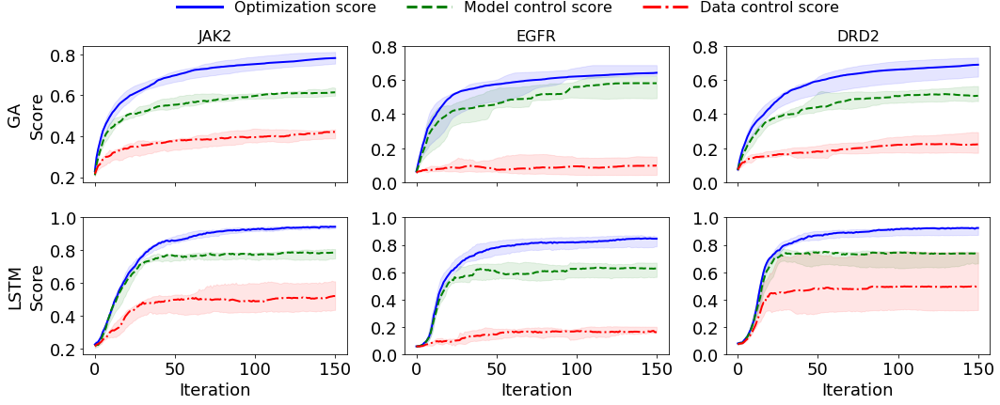

In [ ]:
# some variables for axis labels
xlabel = None
ra = 'Ratio active'

fig, axes = plt.subplots(nrows=2, ncols=len(chids), figsize=(15, 6), sharex=True)

for r_idx, optimizer in enumerate(['graph_ga', 'lstm_hc']):
    ms = 'Score'
    for c_idx, chid in enumerate(chids):
        ax = axes[r_idx][c_idx]
        print(results_dir/optimizer/chid)

        preds_internal, preds_external, auc, _, _ = load_chid(
            results_dir/optimizer/chid, order)

        plot_wrapper(preds_internal, median_score_compound, name='median_score_compound', xlabel=xlabel,
                     ylabel=ms, col_dict=col_dict, legend_dict=legend_dict, ls_dict=ls_dict, skip=[], ax=ax, legend=False, lw=2)
        ms = None
        low, high = ax.set_ylim()
        yticks = np.arange(round(low/0.2) * 0.2, round(high/0.2) * 0.2 +0.01, 0.2)
        if c_idx==0:
            ax.set_yticks(yticks)
        else:
            ax.set_yticks(yticks)
#             ax.set_yticklabels([])
            
    xlabel = 'Iteration'

for i, chid in enumerate(chids):
    axes[0][i].set_title(chid2name[chid], fontsize=16)
    
custom_lines = [Line2D([0], [0], color=col_dict[k], lw=3, ls=ls_dict[k]) for k in col_dict.keys()]
fig.legend(custom_lines, list(legend_dict.values()), loc='upper center', ncol=3, bbox_to_anchor=(0.5, 1.03), frameon=False, fontsize=16,handlelength=3)

# plt.text(0, 0.5, "hithere", rotation=90, verticalalignment='center')
xtext = -55
axes[0][0].text(xtext, sum(axes[0][0].get_ylim()) /2 , "GA", rotation=90, verticalalignment='center')
axes[1][0].text(xtext, sum(axes[1][0].get_ylim()) /2, "LSTM", rotation=90, verticalalignment='center')
fig.tight_layout()
for ft in ['pdf', 'jpg']:
    plt.savefig(f'figures/median_scores.{ft}')

# Figure 2: Scatter plot series
Scatter plots. To create the contours plot the corresponding script (TODO: add name)

In [ ]:
# you need to create this file first by running the trainset predictions script
with open('results/predictions/predictions.p', 'rb') as f:
    trainset_predictions = pickle.load(f)

results/goal_directed_v2/graph_ga/CHEMBL3888429
[  0  50 100 150]


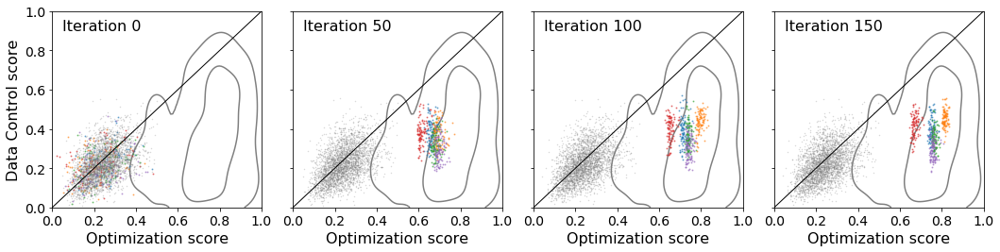

results/goal_directed_v2/lstm_hc/CHEMBL3888429
[  0  50 100 150]


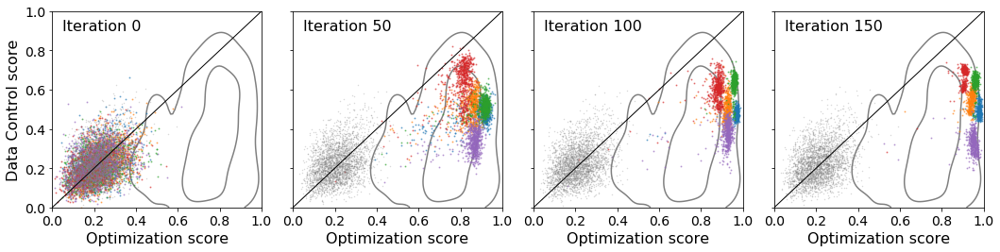

results/goal_directed_v2/graph_ga/CHEMBL1909203
[  0  50 100 150]


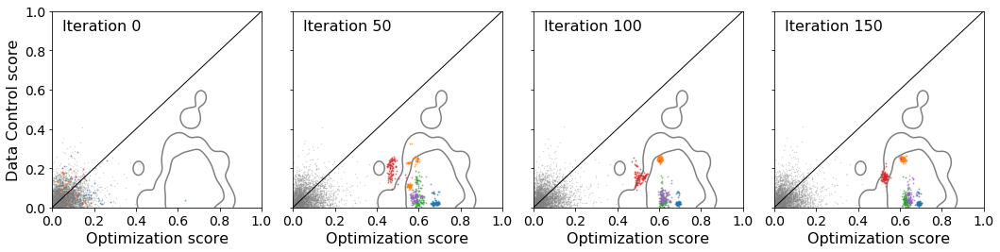

results/goal_directed_v2/lstm_hc/CHEMBL1909203
[  0  50 100 150]


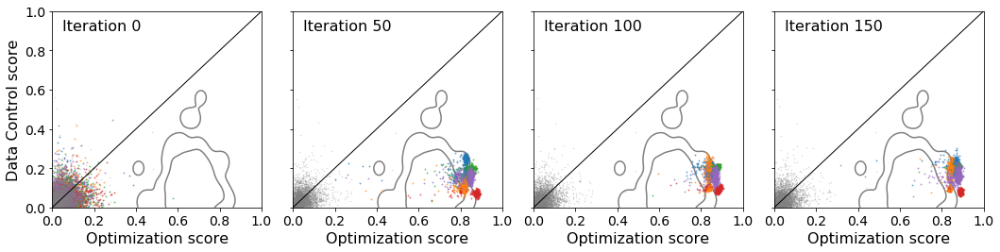

results/goal_directed_v2/graph_ga/CHEMBL1909140
[  0  50 100 150]


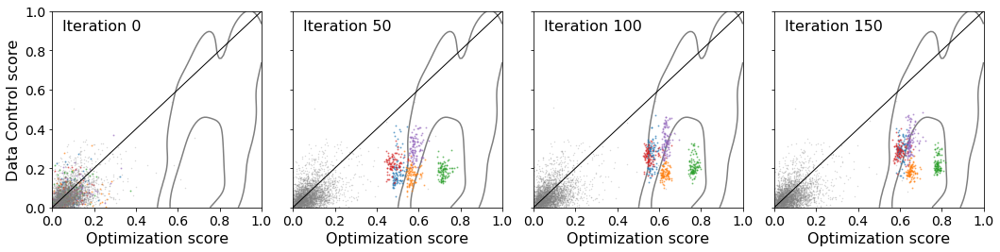

results/goal_directed_v2/lstm_hc/CHEMBL1909140
[  0  50 100 150]


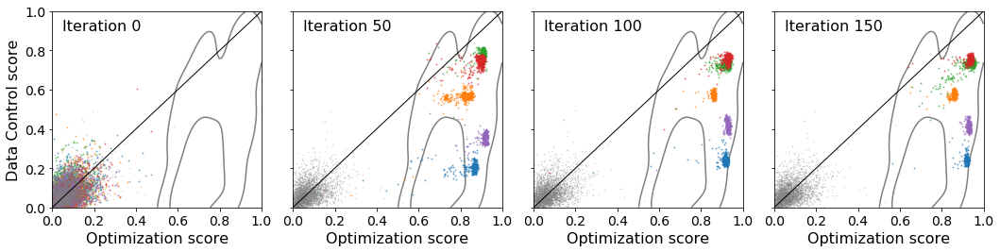

results/goal_directed_v2/graph_ga/CHEMBL3888429
[  0  50 100 150]


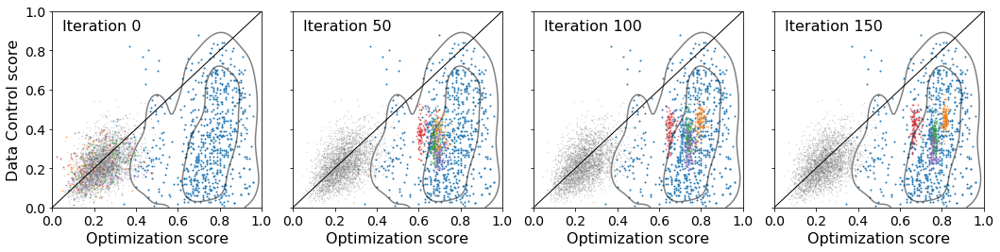

results/goal_directed_v2/lstm_hc/CHEMBL3888429
[  0  50 100 150]


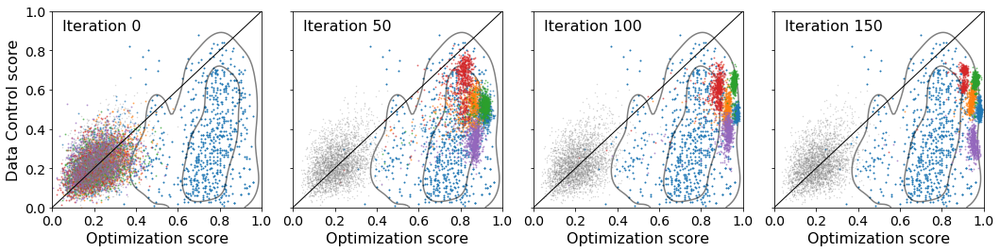

results/goal_directed_v2/graph_ga/CHEMBL1909203
[  0  50 100 150]


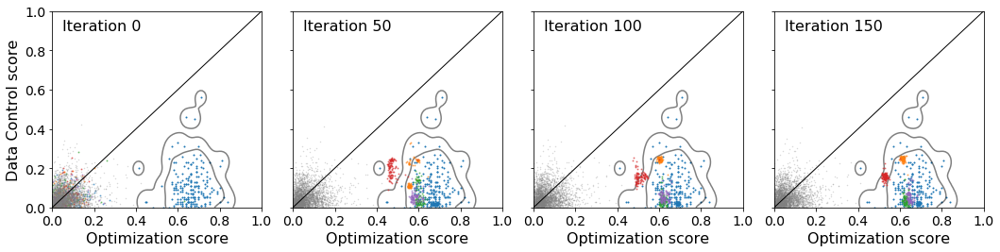

results/goal_directed_v2/lstm_hc/CHEMBL1909203
[  0  50 100 150]


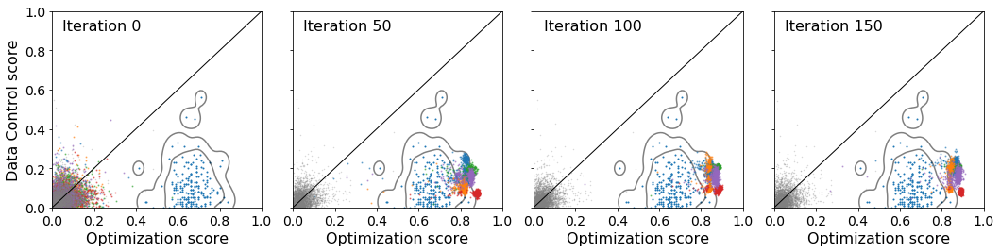

results/goal_directed_v2/graph_ga/CHEMBL1909140
[  0  50 100 150]


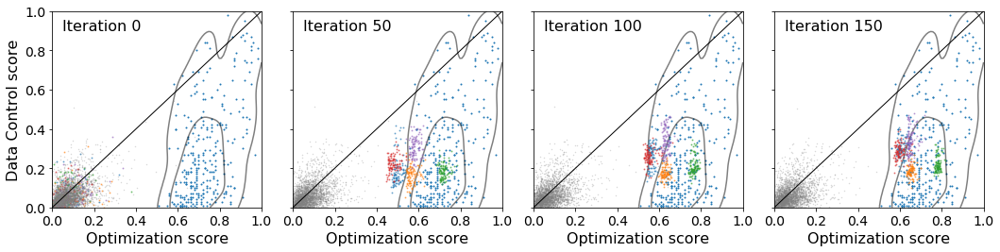

results/goal_directed_v2/lstm_hc/CHEMBL1909140
[  0  50 100 150]


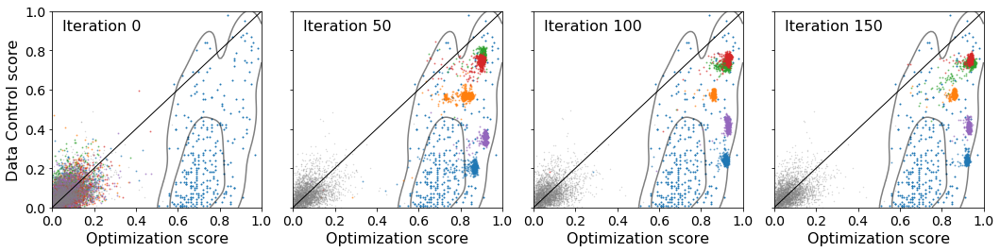

In [ ]:
import seaborn as sns
import scipy.stats as st

chid2name = chid2name
name2chid = {v: k for k,v in chid2name.items()}
scale = 0.005 # for jittering the plotted points
ncols = 4
params = {
    'axes.labelsize': 16,
    'font.size': 16,
#     'legend.fontsize': 18,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'text.usetex': False
}
rcParams.update(params)

n_runs = 5
for scatter in [False, True]:
    for chid in chid2name.keys():
        for optimizer in ['graph_ga', 'lstm_hc']:
            chid_dir = results_dir/optimizer/chid
            print(chid_dir)
            load_chid(chid_dir, order)
            preds_internal, preds_external, auc, _, _ = load_chid(results_dir/optimizer/chid, order)

            split1 = preds_internal['Split1']
            split2 = preds_internal['Split2']

            n_iterations = len(split1[0]) - 1
            plot_iters = np.linspace(0, n_iterations, ncols).astype('int32')
            print(plot_iters)

            step = 35
            fig, axes = plt.subplots(nrows=1, ncols=ncols, figsize=(15, 4), sharey=True)
            ylabel = 'Data Control score'
            for i, iteration in enumerate(plot_iters):   # loop over iterations
                ax = axes[i]

                # test adding contour plot
                p11s, p21s, p12s, p22s, y1s, y2s = trainset_predictions[chid]

                countour(p11s, p21s, y1s, ax, levels=[0.5, 3], scatter=scatter)

    #             idx = np.array(y1s, bool)
    #             sns.kdeplot(p11s[idx], p21s[idx], n_levels=100, shade=False, shade_lowest=False, alpha=0.7, ax=ax)
    #             sns.scatterplot(p11s[idx], p21s[idx], ax=ax,s=10)

                for run in range(n_runs):
                    a1 = jitter(split1[run][iteration], scale=scale)
                    a2 = jitter(split2[run][iteration], scale=scale)
#                     ax.scatter(a1, a2, s=1, alpha=0.5)
                    ax.plot(a1,a2,'o',rasterized=True, markersize=1, alpha=0.5)
                e1 = jitter(preds_external['Split1'][0], scale=scale)
                e2 = jitter(preds_external['Split2'][0], scale=scale)
#                 ax.scatter(e1, e2, s=0.5, alpha=0.3, c='grey')
                ax.plot(e1,e2, 'o', rasterized=True, markersize=0.5, alpha=0.3, c='grey')
                ax.set_xlim((0,1))
                ax.set_ylim((0,1))
                ax.plot([0,1],[0,1], lw=1, c='black')
#                 ax.axvline(0.5, c='black', lw=1)
#                 ax.axhline(0.5, c='black', lw=1)
                ax.set_xticks(np.linspace(0,1,6))
                ax.set_yticks(np.linspace(0,1,6))
                ax.set_ylabel(ylabel)
                ax.set_xlabel('Optimization score')
                ylabel = None

                ax.text(0.05,.9, f"Iteration {iteration}")

    #         fig.suptitle(f"{optimizer} {chid2name[chid]}") # only for dev
            plt.tight_layout()
            plt.subplots_adjust(wspace = 0.15)
            add = 'trainscatter_' if scatter else ''
            plt.savefig(f'./figures/scatter/{add}{optimizer}_{chid2name[chid]}.pdf', dpi=300)
            plt.show()
        


# Visualize the molecules

In [ ]:
from rdkit import Chem
from rdkit.Chem import Draw
from svglib.svglib import svg2rlg
from reportlab.graphics import renderPDF

chid2name = chid2name
name2chid = {v: k for k,v in chid2name.items()}
scale = 0.005
ncols = 4
params = {
    'axes.labelsize': 16,
    'font.size': 16,
#     'legend.fontsize': 18,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'text.usetex': False
}


rcParams.update(params)
from IPython.display import display, SVG, HTML

assay_root = Path('assays/processed/')

smiles_dict = defaultdict(dict)
for chid in chid2name.keys():
    print(chid2name[chid])
    name = chid2name[chid]
    
    file = f"{assay_root/chid}.csv"
    df = pd.read_csv(file)
        
    # set random seed for reproducibility of compound choice
    for optimizer in ['graph_ga', 'lstm_hc']:
        
        chid_dir = results_dir/optimizer/chid
        preds_internal, preds_external, aucs, all_smiles, _ = load_chid(results_dir/optimizer/chid, order)
        
        smiles_dict[name][optimizer] = [s for run in all_smiles for s in run[-1]]
        
    smiles_dict[name]['real'] = df[df.label==1].smiles

RDKit WARNING: [11:38:20] Enabling RDKit 2019.09.1 jupyter extensions


JAK2
EGFR
DRD2


## This draws molecules into a constant sized images
I scale up the font size for large molecules to make the fonts readable for large molecules

In [ ]:
import cairosvg
import rdkit
from rdkit import Chem, Geometry
from rdkit.Chem import AllChem
from rdkit.Chem.Draw import IPythonConsole, rdMolDraw2D

def get_dist(m):
    AllChem.Compute2DCoords(m)

    coords = m.GetConformer(-1).GetPositions()
    min_x, min_y = coords.min(0)[:2]
    max_x, max_y = coords.max(0)[:2]

    x_dist = max_x - min_x + 0.5
    y_dist = max_y - min_y + 0.5
    return x_dist, y_dist

get_dist(Chem.MolFromSmiles('CC'))


np.random.seed(42)
x_size, y_size = 500, 300
mols_per_cat = 6
imgs = []
for name, smiles_cat in smiles_dict.items():
    for cat, smiles in smiles_cat.items():
        print(name, cat)
        sub = np.random.choice(smiles, mols_per_cat)
        for i, s in enumerate(sub):
            m = Chem.MolFromSmiles(s)
            x_dist, y_dist = get_dist(m)
            x_dpa = x_size / x_dist
            y_dpa = y_size / y_dist
            scale = min(x_dpa, y_dpa)
            fs = 14 / scale
            fs = max(fs, 0.7)
            AllChem.Compute2DCoords(m)
            d = rdMolDraw2D.MolDraw2DSVG(x_size, y_size) # or MolDraw2DCairo to get PNGs
            d.SetFontSize(fs)
            d.DrawMolecule(m)
            
            d.FinishDrawing()
            img = d.GetDrawingText()
            imgs.append(img)
            
            fn = '_'.join([name, cat, str(i)])+'.svg'
#             svgfile = plot_dir/'svg'/fn
#             with open(svgfile, 'w') as f:
#                 f.write(img)
#             cairosvg.svg2pdf(url=str(svgfile), write_to=str(svgfile).replace('svg', 'pdf'))


HTML(''.join([f'{i}' for i in imgs]))

JAK2 graph_ga
JAK2 lstm_hc
JAK2 real
EGFR graph_ga
EGFR lstm_hc
EGFR real
DRD2 graph_ga
DRD2 lstm_hc
DRD2 real


# Additional plots not in the paper

## This draws molecules with a constant bond length.

In [ ]:
import cairosvg

plot_dir = Path('./figures/molplots_scale')
os.makedirs(plot_dir, exist_ok=True)
os.makedirs(plot_dir/'svg', exist_ok=True)
os.makedirs(plot_dir/'pdf', exist_ok=True)

np.random.seed(42)
dpa = 20
mols_per_cat = 40
imgs = []
for name, smiles_cat in smiles_dict.items():
    for cat, smiles in smiles_cat.items():
        print(name, cat)
        sub = np.random.choice(smiles, mols_per_cat)
        for i, s in enumerate(sub):
            m = Chem.MolFromSmiles(s)
            x_dist, y_dist = get_dist(m)
            
            AllChem.Compute2DCoords(m)
            d = rdMolDraw2D.MolDraw2DSVG(int(x_dist * dpa), int(y_dist * dpa)) # or MolDraw2DCairo to get PNGs
            d.SetFontSize(fs)
            d.DrawMolecule(m)
            
            d.FinishDrawing()
            img = d.GetDrawingText()
            imgs.append(img)
            
#             fn = '_'.join([name, cat, str(i)])+'.svg'
#             svgfile = plot_dir/'svg'/fn
#             with open(svgfile, 'w') as f:
#                 f.write(img)
#             cairosvg.svg2pdf(url=str(svgfile), write_to=str(svgfile).replace('svg', 'pdf'))


HTML(''.join([f'{i}' for i in imgs]))

JAK2 graph_ga
JAK2 lstm_hc
JAK2 real
EGFR graph_ga
EGFR lstm_hc
EGFR real
DRD2 graph_ga
DRD2 lstm_hc
DRD2 real


## Plot results of genetic algorithm

results/goal_directed_v2/graph_ga/CHEMBL3888429
results/goal_directed_v2/graph_ga/CHEMBL1909203
results/goal_directed_v2/graph_ga/CHEMBL1909140


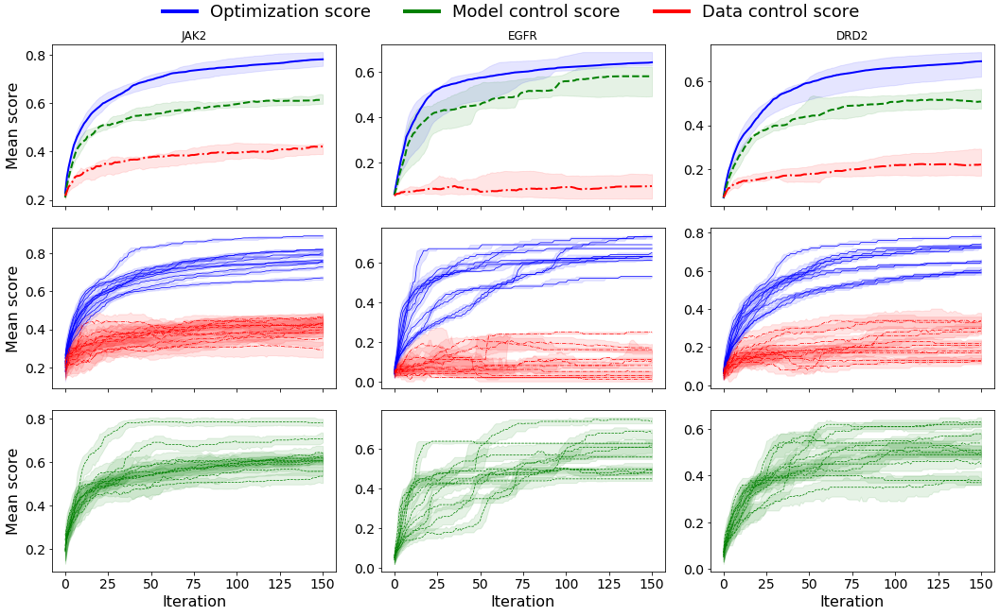

In [ ]:
optimizer = 'graph_ga'

# some variables for axis labels
xlabel = None
ms = 'Mean score'
ra = 'Ratio active'

# TODO: make better yticks
fig, axes = plt.subplots(nrows=3, ncols=len(
    chids), figsize=(15, 9), sharex=True)

# store aucs while looping
aucs = {}
for i, chid in enumerate(chids):
    print(results_dir/optimizer/chid)

    preds_internal, preds_external, auc, _, _ = load_chid(
        results_dir/optimizer/chid, order)
    aucs[chid] = auc

    plot_wrapper(preds_internal, median_score_compound, name='median_score_compound', xlabel=xlabel,
                 ylabel=ms, col_dict=col_dict, legend_dict=legend_dict, skip=[], ax=axes[0][i], legend=False, lw=2, ls_dict=ls_dict)
    plot_wrapper(preds_internal, median_score_single, name='median_score_single', xlabel=xlabel, ylabel=ms,
                 col_dict=col_dict, legend_dict=legend_dict, skip=['Split1_alt'], ax=axes[1][i], legend=False, lw=0.7, ls_dict=ls_dict)
    xlabel = 'Iteration'
    plot_wrapper(preds_internal, median_score_single, name='median_score_single', xlabel=xlabel, ylabel=ms,
                 col_dict=col_dict, legend_dict=legend_dict, skip=['Split1','Split2'], ax=axes[2][i], legend=False, lw=0.7,ls_dict=ls_dict)
    xlabel = None
    ms, ra = None, None

for i, chid in enumerate(chids):
    axes[0][i].set_title(chid2name[chid], fontsize=12)
custom_lines = [Line2D([0], [0], color=color, lw=4)
                for color in col_dict.values()]
fig.legend(custom_lines, list(legend_dict.values()), loc='upper center',
           ncol=3, bbox_to_anchor=(0.5, 1.025), frameon=False)
fig.tight_layout()


# SMILES hillclimb results

results/goal_directed_v2/lstm_hc/CHEMBL3888429
results/goal_directed_v2/lstm_hc/CHEMBL1909203
results/goal_directed_v2/lstm_hc/CHEMBL1909140


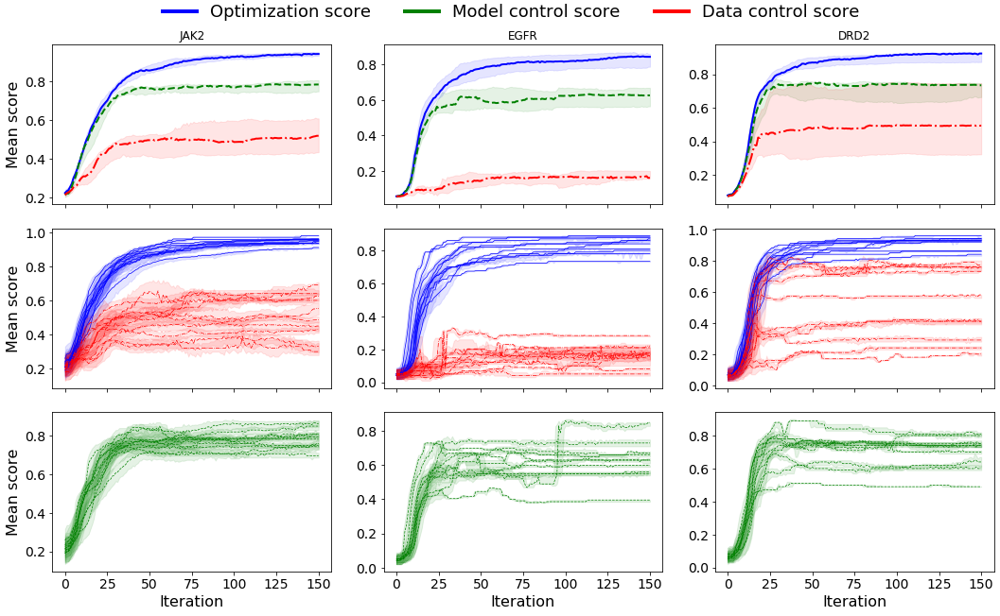

In [ ]:
optimizer = 'lstm_hc'

# some variables for axis labels
xlabel = None
ms = 'Mean score'
ra = 'Ratio active'

# TODO: make better yticks
fig, axes = plt.subplots(nrows=3, ncols=len(
    chids), figsize=(15, 9), sharex=True)

# store aucs while looping
aucs = {}
for i, chid in enumerate(chids):
    print(results_dir/optimizer/chid)

    preds_internal, preds_external, auc, _, _ = load_chid(
        results_dir/optimizer/chid, order)
    aucs[chid] = auc

    plot_wrapper(preds_internal, median_score_compound, name='median_score_compound', xlabel=xlabel,
                 ylabel=ms, col_dict=col_dict, legend_dict=legend_dict, skip=[], ax=axes[0][i], legend=False, lw=2, ls_dict=ls_dict)
    plot_wrapper(preds_internal, median_score_single, name='median_score_single', xlabel=xlabel, ylabel=ms,
                 col_dict=col_dict, legend_dict=legend_dict, skip=['Split1_alt'], ax=axes[1][i], legend=False, lw=0.7,ls_dict=ls_dict)
    xlabel = 'Iteration'
    plot_wrapper(preds_internal, median_score_single, name='median_score_single', xlabel=xlabel, ylabel=ms,
                 col_dict=col_dict, legend_dict=legend_dict, skip=['Split1','Split2'], ax=axes[2][i], legend=False, lw=0.7, ls_dict=ls_dict)
    xlabel = None
    ms, ra = None, None

for i, chid in enumerate(chids):
    axes[0][i].set_title(chid2name[chid], fontsize=12)
custom_lines = [Line2D([0], [0], color=color, lw=4)
                for color in col_dict.values()]
fig.legend(custom_lines, list(legend_dict.values()), loc='upper center',
           ncol=3, bbox_to_anchor=(0.5, 1.025), frameon=False)
fig.tight_layout()


# Comparison of LSTM and GA

results/goal_directed_v2/lstm_hc/CHEMBL3888429
results/goal_directed_v2/lstm_hc/CHEMBL1909203
results/goal_directed_v2/lstm_hc/CHEMBL1909140
results/goal_directed_v2/graph_ga/CHEMBL3888429
results/goal_directed_v2/graph_ga/CHEMBL1909203
results/goal_directed_v2/graph_ga/CHEMBL1909140


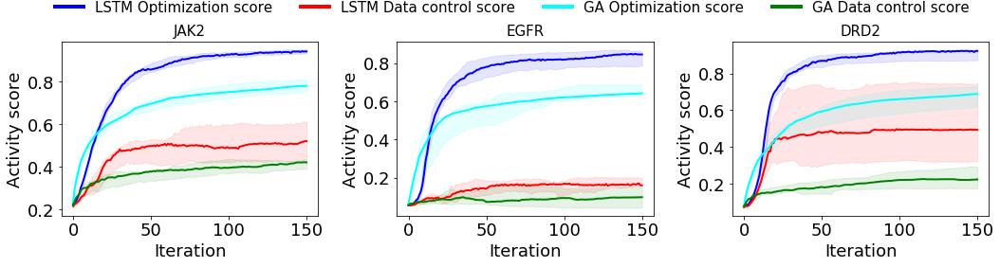

In [ ]:
fig, axes = plt.subplots(nrows=1, ncols=len(chids), figsize=(15, 4), sharex=True)


xlabel = 'Iteration'
for ridx, (optimizer, cd) in enumerate(zip(['lstm_hc', 'graph_ga'], [col_dict, col_dict2])):
    ms = 'Activity score'
    ra = 'Ratio active'
    for i, chid in enumerate(chids):
        print(results_dir/optimizer/chid)

        preds_internal, preds_external, auc, _, _ = load_chid(
            results_dir/optimizer/chid, order)
        
        plot_wrapper(preds_internal, median_score_compound, name='median_score_compound', xlabel=xlabel,
                     ylabel=ms, col_dict=cd, legend_dict=legend_dict, skip=['Split1_alt'], ax=axes[i], legend=False, lw=2, ls_dict=defaultdict(lambda: None))
        

for i, chid in enumerate(chids):
    axes[i].set_title(chid2name[chid], fontsize=15)

def interleave(l1, l2):
    return [val for pair in zip(l1, l2) for val in pair]

lstm_lines = [Line2D([0], [0], color=color, lw=4) for k, color in col_dict.items() if k!='Split1_alt']
ga_lines = [Line2D([0], [0], color=color, lw=4) for k, color in col_dict2.items() if k!='Split1_alt']
lines = lstm_lines+ga_lines
# lines = interleave(lstm_lines, ga_lines)

lstm_names = [f'LSTM {v}' for k, v in legend_dict.items() if k!='Split1_alt']
ga_names = [f'GA {v}' for k, v in legend_dict.items() if k!='Split1_alt']
names = lstm_names + ga_names
# names = interleave(lstm_names, ga_names)

fig.legend(lines, names, loc='upper center', ncol=4, bbox_to_anchor=(0.5, 1.025), frameon=False, fontsize=15)

fig.tight_layout()
plt.savefig('figures/ga_lstm_comparison.pdf')

#TODO: make tick significant digits consistent 

# KDE animations

In [ ]:
# This may take a while
import seaborn as sns
from multiprocessing import Pool

def make_kde_series(optimizer, chid):
    preds_internal, preds_external, auc,_ ,_ = load_chid(results_dir/optimizer/chid, order)
    pred1 = preds_internal['Split1']
    pred2 = preds_internal['Split2']
    pred1_ext = preds_external['Split1']
    pred2_ext = preds_external['Split2']

    kde_dir = Path('figures/kde')/f"{chid}_{optimizer}"
    os.makedirs(kde_dir, exist_ok=True)

    alpha=0.3
    n_ext = 1000

    run_lengths = [len(run) for run in pred1]
    assert all(l == run_lengths[0] for l in run_lengths)

    for it in range(len(pred1[0])):
        for run in range(len(pred1)):
    #         plt.scatter(ext1_all[run][:n_ext], ext2_all[run][:n_ext], s=1, c='black', alpha=0.2)
    #         plt.scatter(pred1[run, it], pred2[run, it], s=3)
            sns.kdeplot(pred1[run][it], pred2[run][it], shade=True,shade_lowest=False, alpha=0.2)
        sns.kdeplot(pred1_ext[run][:n_ext], pred2_ext[run][:n_ext], shade=True,shade_lowest=False, alpha=0.5, cmap='Greys')



        plt.axvline(0.5, c='black', alpha=alpha)
        plt.axhline(0.5, c='black',alpha=alpha)
        plt.xlabel('Optimizer score')
        plt.ylabel('Control score')
    #         plt.legend(loc=2)

        plt.xlim((-0.013,1.013))
        plt.ylim((-0.013,1.013))
        plt.plot((-0.013,1.013), (-0.013,1.013), c='black', alpha=0.4)
        plt.savefig(kde_dir/f'{it:03}')
    #     break
    #     plt.show()
        plt.clf()

optimizers = ['graph_ga', 'lstm_hc']
for optimizer in optimizers:
    for chid in chids:
        print(optimizer, chid)

from itertools import product
with Pool(6) as pool:
    pool.starmap(make_kde_series, product(optimizers, chids))

graph_ga CHEMBL3888429
graph_ga CHEMBL1909203
graph_ga CHEMBL1909140
lstm_hc CHEMBL3888429
lstm_hc CHEMBL1909203
lstm_hc CHEMBL1909140


Process ForkPoolWorker-1:
Process ForkPoolWorker-2:
Process ForkPoolWorker-6:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/home/lfr/anaconda3/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/home/lfr/anaconda3/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/home/lfr/anaconda3/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/home/lfr/anaconda3/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/home/lfr/anaconda3/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/home/lfr/anaconda3/lib/python3.7/multiprocessing/pool.py", line 121, in worker
    result = (True, func(*args, **kwds))
  File "/home/lfr/anaconda3/lib/python3.7/multiprocessing/process.py", line 99, in run
    s

  File "/home/lfr/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/kernels.py", line 125, in gaussian
    return (1. / np.sqrt(2 * np.pi)) * np.exp(-(Xi - x)**2 / (h**2 * 2.))
  File "/home/lfr/anaconda3/lib/python3.7/site-packages/statsmodels/nonparametric/_kernel_base.py", line 514, in gpke
    dens = Kval.prod(axis=1) / np.prod(bw[iscontinuous])
Traceback (most recent call last):
KeyboardInterrupt
  File "/home/lfr/anaconda3/lib/python3.7/site-packages/numpy/core/_methods.py", line 42, in _prod
    return umr_prod(a, axis, dtype, out, keepdims, initial, where)
  File "/home/lfr/anaconda3/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/home/lfr/anaconda3/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/home/lfr/anaconda3/lib/python3.7/multiprocessing/pool.py", line 121, in worker
    result = (True, func(*args, **kwds))
  File "/home/lfr/anaconda3/lib/python3.7/m

KeyboardInterrupt: 

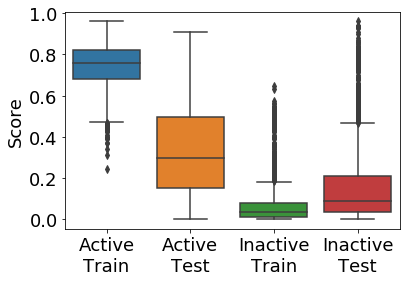

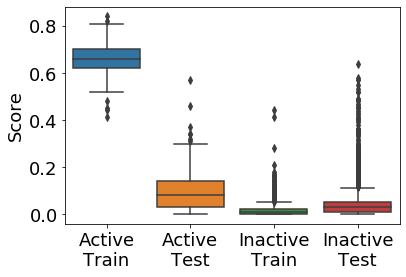

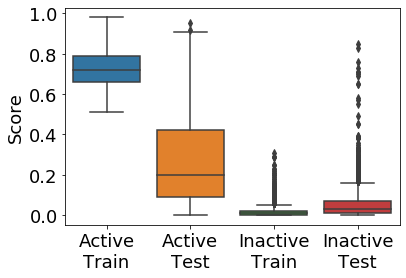

<Figure size 432x288 with 0 Axes>

In [ ]:
import scipy.stats as st
import seaborn as sns

with open('results/predictions/predictions.p', 'rb') as f:
    trainset_predictions = pickle.load(f)

for chid in chids:
    p11s, p21s, p12s, p22s, y1s, y2s = trainset_predictions[chid]


    df_train =  pd.DataFrame({'Score': p11s,
     'Label': ['Active' if l else 'Inactive' for l in y1s],
     'Split': ['Train'] * y1s.shape[0]})
    df_test =  pd.DataFrame({'Score': p12s,
     'Label': ['Active' if l else 'Inactive' for l in y2s],
     'Split': ['Test'] * y2s.shape[0]})

    df = pd.concat([df_train,df_test])
    df['group'] = ['\n'.join([y,x]) for x, y in zip(df.Split, df.Label)]
    df =  df.sort_values('group')
    g = sorted(list(set(df.group)))
    order = [g[1], g[0], g[3], g[2]]
    sns.boxplot(x='group', y='Score', data=df, order=order)
    plt.xlabel(None)
    plt.show()
    plt.savefig('figures/data_biases_boxplot.pdf')

## Calculate correlation between the scores

In [ ]:
from scipy.stats import spearmanr, pearsonr

acc_ext = []
acc_int = []
for chid in chid2name.keys():
    for optimizer in ['graph_ga', 'lstm_hc']:
        chid_dir = results_dir/optimizer/chid
        preds_internal, preds_external, auc, _, _ = load_chid(chid_dir, order)
        
        os = np.concatenate(preds_external['Split1'])
        mcs = np.concatenate(preds_external['Split1_alt'])
        dcs = np.concatenate(preds_external['Split2'])
        os_dcs_spr = spearmanr(os, dcs).correlation
        os_dcs_pr = pearsonr(os, dcs)[0]
        os_mcs_spr = spearmanr(os, mcs).correlation
        os_mcs_pr = pearsonr(os, mcs)[0]
        acc_ext.append([chid2name[chid], optimizer, os_mcs_spr, os_mcs_pr, os_dcs_spr, os_dcs_pr])
        
        os = np.concatenate([s[-1] for s in preds_internal['Split1']])
        mcs = np.concatenate([s[-1] for s in preds_internal['Split1_alt']])
        dcs = np.concatenate([s[-1] for s in preds_internal['Split2']])
#         print(os)
        os_dcs_spr = spearmanr(os, dcs).correlation
        os_dcs_pr = pearsonr(os, dcs)[0]
        os_mcs_spr = spearmanr(os, mcs).correlation
        os_mcs_pr = pearsonr(os, mcs)[0]
        acc_int.append([chid2name[chid], optimizer, os_mcs_spr, os_mcs_pr, os_dcs_spr, os_dcs_pr])
        
        
cols = ['Task', 'Optimizer', 'SpearmanR OS-MCS', 'PearsonR OS-MCS', 'SpearmanR OS-DCS', 'PearsonR OS-DCS']
df_ext = pd.DataFrame(acc_ext)
df_ext.columns = cols
print(df_ext.to_markdown()+'\n')

df_int = pd.DataFrame(acc_int)
df_int.columns = cols
print(df_int.to_markdown())

|    | Task   | Optimizer   |   SpearmanR OS-MCS |   PearsonR OS-MCS |   SpearmanR OS-DCS |   PearsonR OS-DCS |
|---:|:-------|:------------|-------------------:|------------------:|-------------------:|------------------:|
|  0 | JAK2   | graph_ga    |           0.752263 |          0.766563 |           0.362045 |          0.36982  |
|  1 | JAK2   | lstm_hc     |           0.754302 |          0.769395 |           0.368276 |          0.374611 |
|  2 | EGFR   | graph_ga    |           0.698443 |          0.758298 |           0.226968 |          0.216318 |
|  3 | EGFR   | lstm_hc     |           0.691547 |          0.757749 |           0.237924 |          0.231584 |
|  4 | DRD2   | graph_ga    |           0.746666 |          0.796201 |           0.399379 |          0.426517 |
|  5 | DRD2   | lstm_hc     |           0.747676 |          0.797169 |           0.394619 |          0.412861 |

|    | Task   | Optimizer   |   SpearmanR OS-MCS |   PearsonR OS-MCS |   SpearmanR OS-DCS |   PearsonR 